In [6]:
#install the required libraries
!pip install nltk
!pip install plotly==5.11.0
!pip install missingno
!pip install pendulum
!pip install lazypredict
!pip install scalecast
!pip install prophet

In [131]:
#import libraries
import nltk
nltk.download('vader_lexicon')
from nltk.sentiment import SentimentIntensityAnalyzer
from nltk.tokenize import word_tokenize
import pandas as pd
import wordcloud as wc
from wordcloud import WordCloud, STOPWORDS
import requests
import re
import matplotlib.pyplot as plt
import  numpy as np
from PIL import Image
import plotly.express as px
import seaborn as sns
import warnings
import missingno as msno
import pendulum as pdl
from statsmodels.tsa.seasonal import seasonal_decompose
import lazypredict
from lazypredict.Supervised import LazyRegressor

import sklearn
from sklearn.ensemble import ExtraTreesRegressor, RandomForestRegressor
from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.ensemble import HistGradientBoostingRegressor
import sklearn.metrics as sm
import statsmodels.api as sma
from scalecast.Forecaster import Forecaster
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima.model import ARIMA
from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly

from lazypredict.Supervised import LazyClassifier
from sklearn.dummy import DummyClassifier

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\hinal\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


### PROBLEM STATEMENT

There are various problems with airports but the Newark Airport stands out with its endless list of issues.
Among the various issues, the issue with flight delay stands out.
To prove this, we fetched the various tweets made for the EWR airport and did a sentiment analysis which proves that we have more negatie tweets than positive for the EWR airport.

In [2]:
#read the tweets data
tweets = pd.read_csv("mining.csv").drop(["Unnamed: 0"], axis=1)
tweets.head()

<IPython.core.display.Javascript object>

,title,media,date,datetime,desc,link,img
0,Newark Airport Will No Longer Be A NYC Airport...,Simple Flying,1 month ago,2022-09-30 18:15:07.914922,What changes now that EWR will not fall under ...,https://simpleflying.com/newark-iata-nyc-airport/,"data:image/gif;base64,R0lGODlhAQABAIAAAP//////..."
1,IATA To Cut Newark Airport Out Of The New York...,AVweb,1 month ago,2022-09-30 18:15:07.924601,"EWR). Aside from bragging rights, a memorandum...",https://www.avweb.com/aviation-news/iata-to-cu...,"data:image/gif;base64,R0lGODlhAQABAIAAAP//////..."
2,Newark airport will no longer be NYC-area airp...,News 12 New Jersey,1 month ago,2022-09-30 18:15:07.933801,"However, airlines could charge a penalty fee f...",https://newjersey.news12.com/newark-liberty-in...,"data:image/gif;base64,R0lGODlhAQABAIAAAP//////..."
3,Spirit adds daily nonstop between OAK and Newa...,Oakland Airport,"ar 24, 2022",NaN,EWR is the eighth destination now offered by S...,https://www.oaklandairport.com/spirit-adds-dai...,"data:image/gif;base64,R0lGODlhAQABAIAAAP//////..."
4,Newark Airport Is Officially No Longer a New Y...,Matador Network,1 month ago,2022-09-30 18:15:07.948707,"For one, flying into EWR might cause flight pr...",https://matadornetwork.com/read/newark-airport...,"data:image/gif;base64,R0lGODlhAQABAIAAAP//////..."


Here the 'desc' column has the contents of the tweet made and hence we will do sentiment analysis on 'desc' column.

In [8]:
#function to generate the sentiment analysis report
def sentimentanalyses(body):
    sia = SentimentIntensityAnalyzer()
    scores = sia.polarity_scores(body)
    if(scores.get('compound') >= 0.5):
        return('Positive')
    return('Negative')

In [9]:
#get the sentiment based on desc column 
tweets['Sentiment'] = tweets['desc'].apply(lambda x: sentimentanalyses(x))
tweets.head()

,title,media,date,datetime,desc,link,img,Sentiment
0,Newark Airport Will No Longer Be A NYC Airport...,Simple Flying,1 month ago,2022-09-30 18:15:07.914922,What changes now that EWR will not fall under ...,https://simpleflying.com/newark-iata-nyc-airport/,"data:image/gif;base64,R0lGODlhAQABAIAAAP//////...",Positive
1,IATA To Cut Newark Airport Out Of The New York...,AVweb,1 month ago,2022-09-30 18:15:07.924601,"EWR). Aside from bragging rights, a memorandum...",https://www.avweb.com/aviation-news/iata-to-cu...,"data:image/gif;base64,R0lGODlhAQABAIAAAP//////...",Negative
2,Newark airport will no longer be NYC-area airp...,News 12 New Jersey,1 month ago,2022-09-30 18:15:07.933801,"However, airlines could charge a penalty fee f...",https://newjersey.news12.com/newark-liberty-in...,"data:image/gif;base64,R0lGODlhAQABAIAAAP//////...",Negative
3,Spirit adds daily nonstop between OAK and Newa...,Oakland Airport,"ar 24, 2022",NaN,EWR is the eighth destination now offered by S...,https://www.oaklandairport.com/spirit-adds-dai...,"data:image/gif;base64,R0lGODlhAQABAIAAAP//////...",Negative
4,Newark Airport Is Officially No Longer a New Y...,Matador Network,1 month ago,2022-09-30 18:15:07.948707,"For one, flying into EWR might cause flight pr...",https://matadornetwork.com/read/newark-airport...,"data:image/gif;base64,R0lGODlhAQABAIAAAP//////...",Negative


In [12]:
#get the positive to negative tweet ratio
pos_count = tweets.desc[tweets["Sentiment"]=="Positive"].count()
neg_count = tweets.desc[tweets["Sentiment"]=="Negative"].count()
print("The positive to negative tweets ratio is:", pos_count, ":", neg_count)

The positive to negative tweets ratio is: 164 : 353


#### Generating Word Cloud

In [13]:
#initialize the required variables
comment_words_positive = ''
comment_words_negative = ''
stopwords = set(STOPWORDS)

In [14]:
#Tokenization
pos = pd.DataFrame(tweets.desc[tweets["Sentiment"]=="Positive"])
neg = pd.DataFrame(tweets.desc[tweets["Sentiment"]=="Negative"])
for val_pos, val_neg in zip(pos.desc,neg.desc):
    val_pos = str(val_pos)
    val_neg = str(val_neg)
    tokens_pos = val_pos.split()
    tokens_neg = val_neg.split()
    for i in range(len(tokens_pos)): 
        tokens_pos[i] = tokens_pos[i].lower()
    for i in range(len(tokens_neg)): 
        tokens_neg[i] = tokens_neg[i].lower()
    comment_words_positive += " ".join(tokens_pos)+" "
    comment_words_negative += " ".join(tokens_neg)+" "    

In [15]:
#Give shape to the word cloud
pic = np.array(Image.open(requests.get('http://www.clker.com/cliparts/O/i/x/Y/q/P/yellow-house-hi.png',stream=True).raw))
wordcloud_positive = WordCloud(width = 800, height = 800, 
                background_color ='white', color_func=wc.get_single_color_func('green'),
                stopwords = stopwords, mask = pic, 
                min_font_size = 10).generate(comment_words_positive)
wordcloud_negative = WordCloud(width = 800, height = 800, 
                background_color ='white', color_func=wc.get_single_color_func('red'),
                stopwords = stopwords, mask = pic, 
                min_font_size = 10).generate(comment_words_negative)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

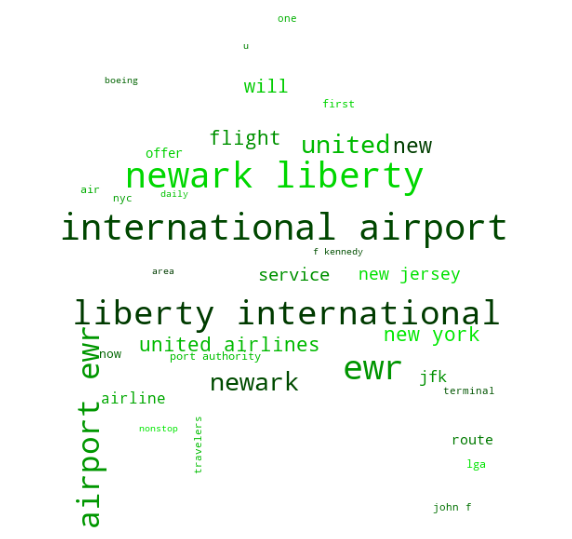

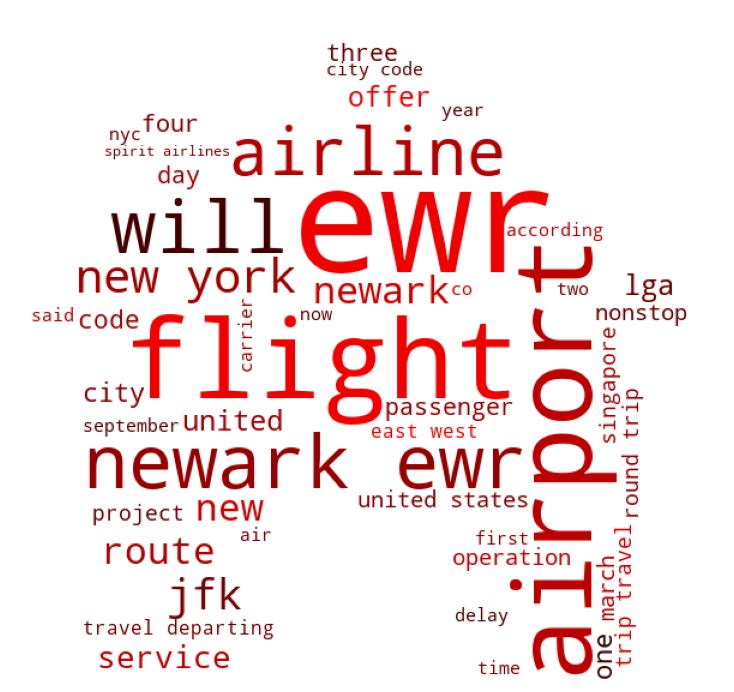

In [17]:
#generate word cloud

#positive word cloud
plt.figure(figsize = (10, 10), facecolor = 'white', edgecolor='blue') 
plt.imshow(wordcloud_positive)
plt.axis("off")

#negative word cloud
plt.figure(figsize = (10, 10), facecolor = 'white', edgecolor='blue') 
plt.imshow(wordcloud_negative, cmap='Accent')
plt.axis("off")

plt.tight_layout(pad = 0)  
plt.show()

#### Generate Word Frequency

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\hinal\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


<IPython.core.display.Javascript object>

C:\Users\hinal\AppData\Local\Temp/ipykernel_13512/370604067.py:27: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  data=dtf_freq.groupby('ngrams')["ngrams","freq","word"].head(30))


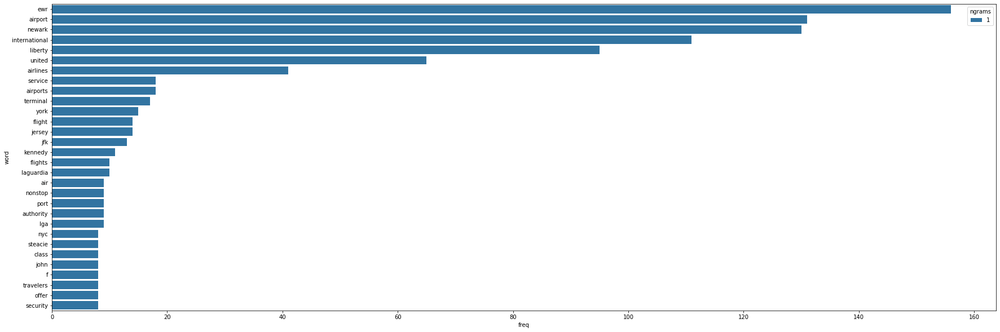

In [18]:
#positive word frequency
from nltk.corpus import stopwords
nltk.download('stopwords')

text = comment_words_positive
new_text = re.sub(r"[^a-zA-Z0-9 ]", "", text)
text_tokens = word_tokenize(new_text)

tokens_without_sw = [word for word in text_tokens if not word in stopwords.words()]

ngrams = [1]
    
## calculate
dtf_freq = pd.DataFrame()
for n in ngrams:
    dic_words_freq = nltk.FreqDist(nltk.ngrams(tokens_without_sw, n))
    dtf_n = pd.DataFrame(dic_words_freq.most_common(), columns=
                        ["word","freq"])
    dtf_n["ngrams"] = n
    dtf_freq = dtf_freq.append(dtf_n)
    dtf_freq["word"] = dtf_freq["word"].apply(lambda x: "".join(string for string in x) )
    dtf_freq_X= dtf_freq.sort_values(["ngrams","freq"], ascending=[True,False])
    
## plot
fig, ax = plt.subplots(figsize=(30, 10))
sns.barplot(x="freq", y="word", hue="ngrams", dodge=False,
 data=dtf_freq.groupby('ngrams')["ngrams","freq","word"].head(30))
plt.show()

<IPython.core.display.Javascript object>

C:\Users\hinal\AppData\Local\Temp/ipykernel_13512/2861666918.py:24: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  data=dtf_freq.groupby('ngrams')["ngrams","freq","word"].head(30))


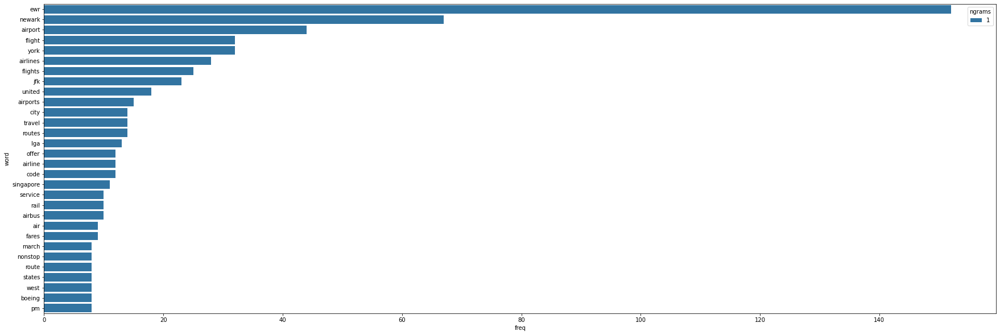

In [20]:
#negative word frequency
text = comment_words_negative
new_text = re.sub(r"[^a-zA-Z0-9 ]", "", text)
text_tokens = word_tokenize(new_text)

tokens_without_sw = [word for word in text_tokens if not word in stopwords.words()]

ngrams = [1]
    
## calculate
dtf_freq = pd.DataFrame()
for n in ngrams:
    dic_words_freq = nltk.FreqDist(nltk.ngrams(tokens_without_sw, n))
    dtf_n = pd.DataFrame(dic_words_freq.most_common(), columns=
                        ["word","freq"])
    dtf_n["ngrams"] = n
    dtf_freq = dtf_freq.append(dtf_n)
    dtf_freq["word"] = dtf_freq["word"].apply(lambda x: "".join(string for string in x) )
    dtf_freq_X= dtf_freq.sort_values(["ngrams","freq"], ascending=[True,False])
    
## plot
fig, ax = plt.subplots(figsize=(30, 10))
sns.barplot(x="freq", y="word", hue="ngrams", dodge=False,
 data=dtf_freq.groupby('ngrams')["ngrams","freq","word"].head(30))
plt.show()

### REPORT

From the above observations it is clear that EWR airport has a lot of issues and this project will be targetted towards predicting the number of arrivals so that the airport can prepare accordingly and help avoid delays.

### INITIAL REQUIREMENTS

In [21]:
#read the aviation data
ewr = pd.read_csv("aviation_data_merged.csv")
ewr.head()

,date,hour,runway,weather,dep_eff_comp,arr_eff_comp,total_eff_comp,dep_facility_rep,arr_facility_rep,total_facility_rep,...,per_ontime_arp_dep,per_ontime_gate_arr,avg_gate_dep_delay,avg_taxi_out_time,avg_taxi_out_delay,avg_arp_dep_delay,avg_airborn_delay,avg_tax_in_dealy,avg_block_delay,avg_gate_arr_delay
0,1/1/22,0.0,22L | 22R,IMC,5,10,15,0,0,0,...,0.0,66.67,110.50,12.00,0.00,109.5,3.22,4.22,2.89,14.22
1,1/1/22,1.0,22L | 22R,IMC,2,3,5,0,0,0,...,0.0,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00
2,1/1/22,2.0,22L | 22R,IMC,0,0,0,0,0,0,...,0.0,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00
3,1/1/22,3.0,22L | 22R,IMC,1,1,2,0,0,0,...,0.0,60.00,0.00,0.00,0.00,0.0,1.00,0.98,3.60,43.80
4,1/1/22,4.0,22L | 22R,IMC,0,2,2,0,0,0,...,100.0,66.67,0.25,14.25,2.15,1.0,15.83,2.20,18.67,38.50


In [23]:
#get the shape of the datafrme
ewr.shape

(5837, 37)

In [25]:
#Find number of non-null values and data type of each column in the dataframe
ewr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5837 entries, 0 to 5836
Data columns (total 37 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   date                  5832 non-null   object 
 1   hour                  5832 non-null   float64
 2   runway                5741 non-null   object 
 3   weather               5832 non-null   object 
 4   dep_eff_comp          5833 non-null   object 
 5   arr_eff_comp          5833 non-null   object 
 6   total_eff_comp        5833 non-null   object 
 7   dep_facility_rep      5833 non-null   object 
 8   arr_facility_rep      5833 non-null   object 
 9   total_facility_rep    5833 non-null   object 
 10  dep_demand_units      5833 non-null   object 
 11  arr_demand_units      5833 non-null   object 
 12  total_demand_units    5833 non-null   object 
 13  eff_aar               5833 non-null   object 
 14  adr                   5833 non-null   object 
 15  cap_aar              

In [28]:
#get the summary of the dataset
ewr.describe()

,hour,avg_cap,cap_utilized_percent,dep_eff,arr_eff,saer,per_ontime_gate_dep,per_ontime_arp_dep,per_ontime_gate_arr,avg_gate_dep_delay,avg_taxi_out_time,avg_taxi_out_delay,avg_arp_dep_delay,avg_airborn_delay,avg_tax_in_dealy,avg_block_delay,avg_gate_arr_delay
count,5832.00000,5833.000000,5833.000000,5833.000000,5833.000000,5833.000000,5797.000000,5797.000000,5797.000000,5797.000000,5797.000000,5797.000000,5797.000000,5797.000000,5797.000000,5797.000000,5797.000000
mean,11.50000,76.660895,58.146403,91.287833,95.594646,93.156983,61.381930,48.568106,65.664989,20.494901,20.086721,8.944042,28.082914,3.337699,6.216476,5.597406,20.955903
std,6.92278,8.437916,29.754681,12.450909,10.136614,9.815878,30.441751,31.592384,27.231230,24.576788,10.963796,9.070444,29.757648,5.510457,5.923113,8.085037,25.191452
min,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,5.75000,78.000000,32.500000,87.730000,95.650000,90.910000,44.830000,21.740000,52.940000,4.970000,15.970000,3.610000,9.000000,1.000000,2.560000,1.470000,6.180000
50%,11.50000,80.000000,67.500000,95.220000,100.000000,96.150000,69.230000,51.160000,73.530000,13.890000,19.660000,7.200000,21.000000,2.400000,4.770000,3.530000,13.600000
75%,17.25000,80.000000,81.250000,100.000000,100.000000,100.000000,84.620000,74.070000,85.000000,26.980000,23.970000,11.450000,36.720000,3.920000,8.120000,6.870000,26.440000
max,23.00000,94.000000,140.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,237.000000,103.000000,90.400000,277.400000,153.040000,86.680000,157.270000,354.550000


### DATA CLEAN UP AND SANITY CHECKS

The Date column is not in the correct format. So we work on converting it to a readable format. Also, since we are going to use time series analysis, it is a better option to make the date column as the index.

In [ ]:
# Avoiding null rows 
ewr = ewr.iloc[:-5,:]

date_col = ewr['date']+" "+ewr['hour'].astype(int).astype(str)

## Parsing date_col to pdl.datetime format
for i in range(len(ewr)):
    temp = date_col[i]
    temp = pdl.from_format(temp, 'MM/DD/YY HH')
    ewr['date'][i] = temp

# Reindexing the df with newly converted datetime format column
ewr.index = ewr['date']

# Droping extra column
ewr = ewr.drop(['date', 'hour'], axis=1)

Lets find the percentage of null values in each column

In [36]:
ewr.isnull().sum()/len(ewr)*100

runway                  1.560357
weather                 0.000000
dep_eff_comp            0.000000
arr_eff_comp            0.000000
total_eff_comp          0.000000
dep_facility_rep        0.000000
arr_facility_rep        0.000000
total_facility_rep      0.000000
dep_demand_units        0.000000
arr_demand_units        0.000000
total_demand_units      0.000000
eff_aar                 0.000000
adr                     0.000000
cap_aar                 0.000000
adr_plus_cap_aar        0.000000
avg_cap                 0.000000
cap_utilized_percent    0.000000
dep_eff                 0.000000
arr_eff                 0.000000
saer                    0.000000
sched_dep               0.600137
sched_arr               0.600137
dep_metric_comp         0.600137
arr_metric_comp         0.600137
per_ontime_gate_dep     0.600137
per_ontime_arp_dep      0.600137
per_ontime_gate_arr     0.600137
avg_gate_dep_delay      0.600137
avg_taxi_out_time       0.600137
avg_taxi_out_delay      0.600137
avg_arp_de

We have minimal null values in the data and hence we can remove those rows.

In [37]:
#drop the rows that have null values
ewr=ewr[:-36]

Now we check whether there are any columns that have same value for all the rows

In [38]:
counter = 0
for this_column in ewr.columns:
    if (ewr[this_column].nunique()==1):
        print(this_column)
        counter = 1
if(counter != 1):
    print('There are no such columns having the same value for all the rows.')

There are no such columns having the same value for all the rows.


Now lets get the number of uniques values per column and their counts

In [39]:
#function to number of unique values and its count for all columns in a data frame
def uniq_per_col(df,count):
    for this_column in df.columns:
        print("==== ",this_column,"has",df[this_column].nunique(),"unique entries ====")
        print(df[this_column].value_counts().head(count))

In [40]:
#get the number of unique values per column
uniq_per_col(ewr,5)

====  runway has 15 unique entries ====
22L | 22R        2740
4R | 4L          1782
29 | 22R          272
11, 22L | 22R     219
22R | 22R         196
Name: runway, dtype: int64
====  weather has 2 unique entries ====
VMC    4814
IMC     982
Name: weather, dtype: int64
====  dep_eff_comp has 52 unique entries ====
0     306
33    201
31    200
30    196
1     195
Name: dep_eff_comp, dtype: int64
====  arr_eff_comp has 50 unique entries ====
27    240
30    223
29    212
31    197
28    196
Name: arr_eff_comp, dtype: int64
====  total_eff_comp has 86 unique entries ====
63    154
65    149
66    146
60    142
62    141
Name: total_eff_comp, dtype: int64
====  dep_facility_rep has 52 unique entries ====
0     1737
31     211
33     208
28     190
27     189
Name: dep_facility_rep, dtype: int64
====  arr_facility_rep has 49 unique entries ====
0     1734
27     224
30     222
29     207
28     204
Name: arr_facility_rep, dtype: int64
====  total_facility_rep has 83 unique entries ====
0   

From the above observation it is clear that, we have a good variety of data.
Also, the datatypes of the columns 'runway', and 'weather' can be converted to 'Categorical' from 'object' and the rest to numeric

In [42]:
#update the datatype of the above columns
ewr['runway'] = ewr['runway'].astype('category')
ewr['weather'] = ewr['weather'].astype('category')

ewr[['dep_eff_comp','arr_eff_comp',
    'total_eff_comp','dep_facility_rep',
    'arr_facility_rep','total_facility_rep',
    'dep_demand_units','arr_demand_units',
    'total_demand_units','eff_aar',
    'adr','cap_aar',
    'adr_plus_cap_aar',
    'sched_dep','sched_arr',
    'dep_metric_comp','arr_metric_comp']]= ewr[['dep_eff_comp','arr_eff_comp',
                                               'total_eff_comp','dep_facility_rep',
                                               'arr_facility_rep','total_facility_rep',
                                               'dep_demand_units','arr_demand_units',
                                               'total_demand_units','eff_aar','adr',
                                               'cap_aar','adr_plus_cap_aar','sched_dep',
                                               'sched_arr','dep_metric_comp','arr_metric_comp']].apply(pd.to_numeric)

Let us now see if we have any null values in the columns and see their distribution

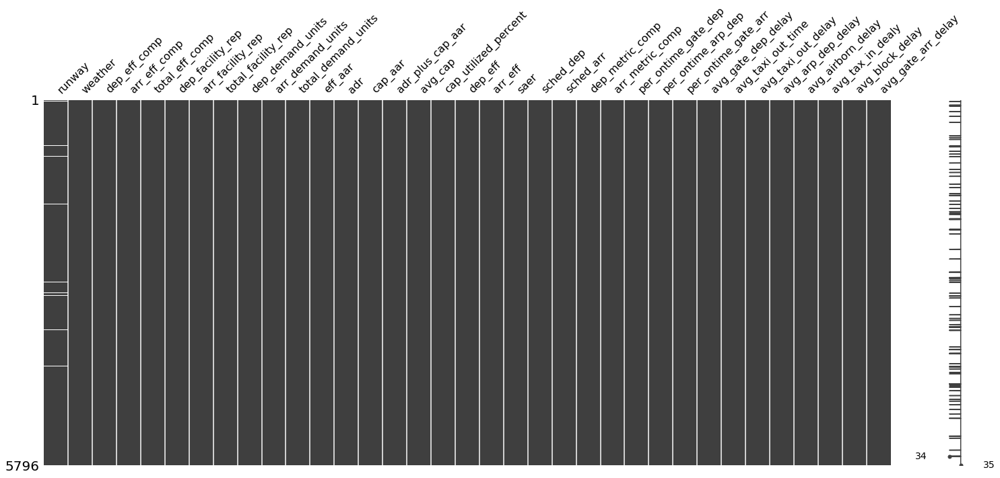

In [44]:
_=msno.matrix(ewr.sample(ewr.shape[0]))
#Black = filled; white = empty

### REPORT

The date column needed formatting. Also, we converted the date column as index for ease of processing.
There were no columns where all the rows had the same value.
There were no columns where all the rows were null.
Hence there was no need to drop any column.
There were a few columns viz 'runway' and 'weather' which had categorical data and hence their data type was updated for better functioning.
There were a few columns that had to be converted to numeric type.
There was very less data that had null values and hence it was removed.
The data is now clean and ready for analysis.

### EXPLORATORY DATA ANALYSIS

Let us first find the correlation between the variables.

In [45]:
#get the correlation of the variables
ewr.corr()

,dep_eff_comp,arr_eff_comp,total_eff_comp,dep_facility_rep,arr_facility_rep,total_facility_rep,dep_demand_units,arr_demand_units,total_demand_units,eff_aar,...,per_ontime_arp_dep,per_ontime_gate_arr,avg_gate_dep_delay,avg_taxi_out_time,avg_taxi_out_delay,avg_arp_dep_delay,avg_airborn_delay,avg_tax_in_dealy,avg_block_delay,avg_gate_arr_delay
dep_eff_comp,1.000000,0.758646,0.944734,0.944068,0.765455,0.891424,0.801592,0.510329,0.757089,0.305030,...,-0.058894,-0.008974,0.116487,0.138394,0.121946,0.132898,0.062139,0.135141,0.099294,0.079115
arr_eff_comp,0.758646,1.000000,0.930306,0.747085,0.929087,0.870256,0.596118,0.702656,0.746273,0.346845,...,-0.093666,-0.027280,0.151743,0.158845,0.148614,0.170572,0.077199,0.180863,0.129155,0.099858
total_eff_comp,0.944734,0.930306,1.000000,0.907428,0.898456,0.939770,0.751250,0.640884,0.801754,0.346259,...,-0.080289,-0.018780,0.141937,0.157845,0.143436,0.160652,0.073830,0.167093,0.120892,0.094789
dep_facility_rep,0.944068,0.747085,0.907428,1.000000,0.846626,0.962498,0.773279,0.517454,0.744611,0.283300,...,-0.066444,-0.001429,0.116585,0.136631,0.120257,0.133019,0.059405,0.135250,0.099124,0.083201
arr_facility_rep,0.765455,0.929087,0.898456,0.846626,1.000000,0.959253,0.617644,0.667842,0.739090,0.309062,...,-0.102621,-0.022325,0.145989,0.149974,0.140420,0.163981,0.072873,0.173005,0.126207,0.102615
total_facility_rep,0.891424,0.870256,0.939770,0.962498,0.959253,1.000000,0.725400,0.615168,0.772089,0.307958,...,-0.087589,-0.012139,0.136317,0.148992,0.135428,0.154214,0.068687,0.159999,0.116963,0.096482
dep_demand_units,0.801592,0.596118,0.751250,0.773279,0.617644,0.725400,1.000000,0.510774,0.873102,0.115501,...,-0.102802,-0.068528,0.134991,0.116873,0.115537,0.148218,0.051959,0.160796,0.118609,0.101980
arr_demand_units,0.510329,0.702656,0.640884,0.517454,0.667842,0.615168,0.510774,1.000000,0.865101,0.007301,...,-0.129294,-0.107848,0.186196,0.113707,0.111315,0.191195,0.086599,0.207955,0.161973,0.152245
total_demand_units,0.757089,0.746273,0.801754,0.744611,0.739090,0.772089,0.873102,0.865101,1.000000,0.071529,...,-0.133301,-0.101142,0.184350,0.132672,0.130535,0.194902,0.079425,0.211746,0.161056,0.145837
eff_aar,0.305030,0.346845,0.346259,0.283300,0.309062,0.307958,0.115501,0.007301,0.071529,1.000000,...,0.020710,0.070816,0.001405,0.083678,0.077856,0.022322,0.033036,0.014741,0.019606,-0.006437


Let us now find the univariate analysis

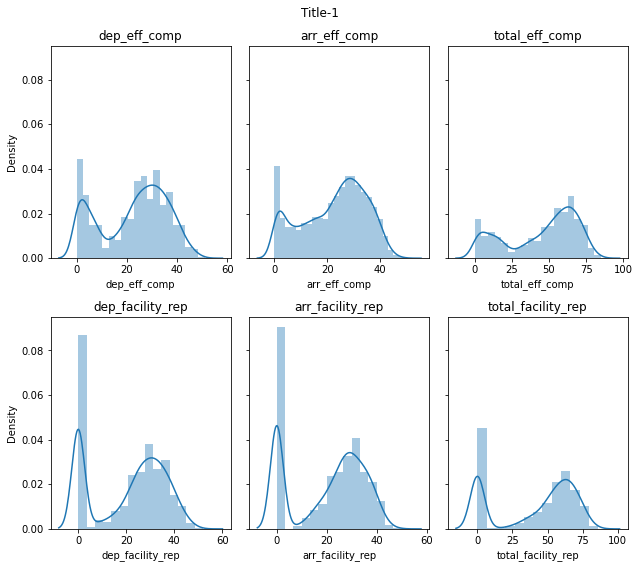

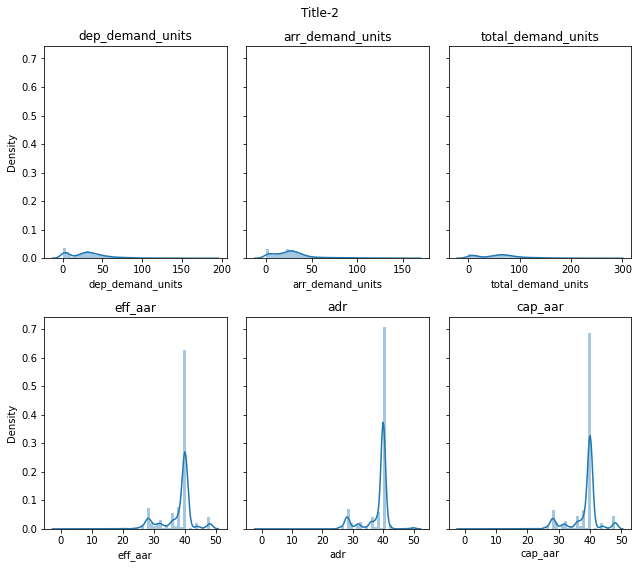

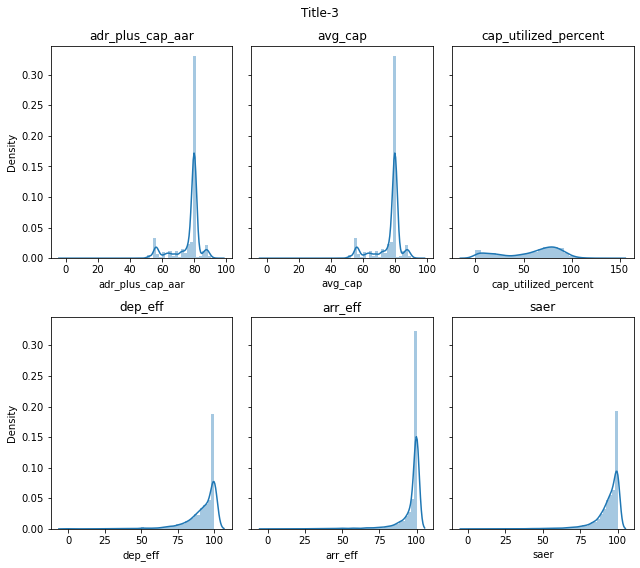

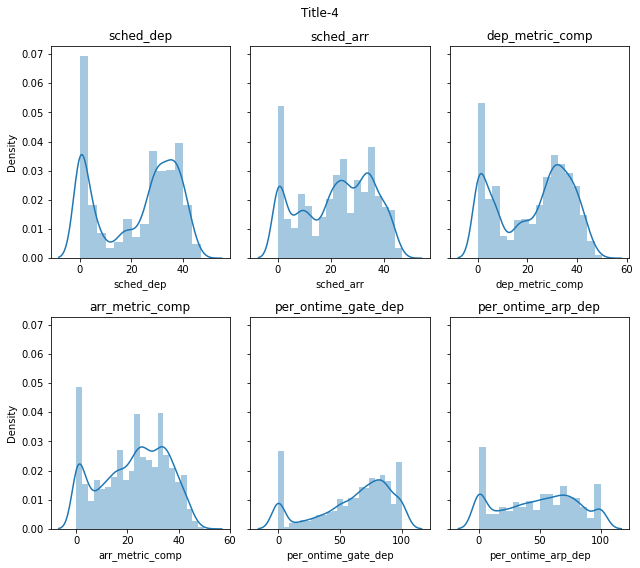

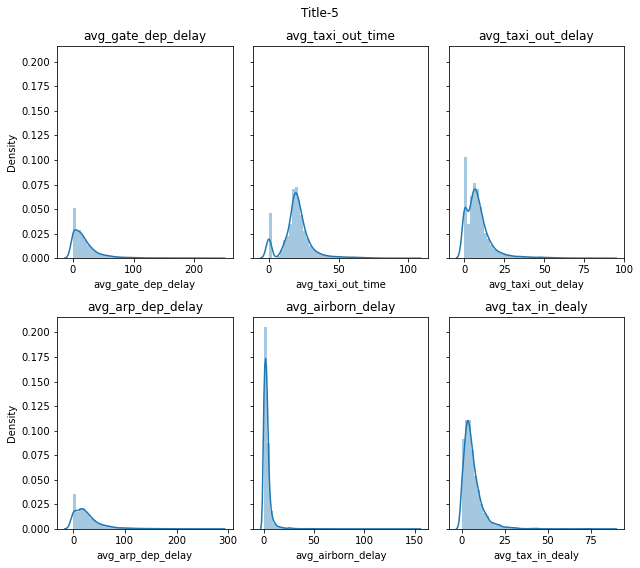

In [47]:
#Univariate Analysis
warnings.filterwarnings(action='ignore', category=FutureWarning)

def uni_plot(title,var1,var2,var3,var4,var5,var6):
    fig, axes = plt.subplots(2, 3, figsize=(9, 8), sharey=True)
    fig.suptitle(title)

    sns.distplot(ewr[var1],ax=axes[0,0])
    axes[0,0].set_title(var1)

    sns.distplot(ewr[var2],ax=axes[0,1])
    axes[0,1].set_title(var2)

    sns.distplot(ewr[var3],ax=axes[0,2])
    axes[0,2].set_title(var3)

    sns.distplot(ewr[var4],ax=axes[1,0])
    axes[1,0].set_title(var4)

    sns.distplot(ewr[var5],ax=axes[1,1])
    axes[1,1].set_title(var5)

    sns.distplot(ewr[var6],ax=axes[1,2])
    axes[1,2].set_title(var6)

    plt.tight_layout()
    plt.show();

uni_plot('Title-1','dep_eff_comp', 'arr_eff_comp', 'total_eff_comp',
       'dep_facility_rep','arr_facility_rep', 'total_facility_rep')
uni_plot('Title-2','dep_demand_units', 'arr_demand_units',
         'total_demand_units', 'eff_aar',
       'adr', 'cap_aar')
uni_plot('Title-3','adr_plus_cap_aar', 'avg_cap', 'cap_utilized_percent',
       'dep_eff', 'arr_eff','saer')
uni_plot('Title-4','sched_dep', 'sched_arr',
       'dep_metric_comp', 'arr_metric_comp', 'per_ontime_gate_dep',
       'per_ontime_arp_dep')
uni_plot('Title-5','avg_gate_dep_delay',
       'avg_taxi_out_time', 'avg_taxi_out_delay', 'avg_arp_dep_delay',
       'avg_airborn_delay', 'avg_tax_in_dealy')


From the univariate analysis it is clear that the data is multimodal.
Let us now concentrate on bivariate analysis.

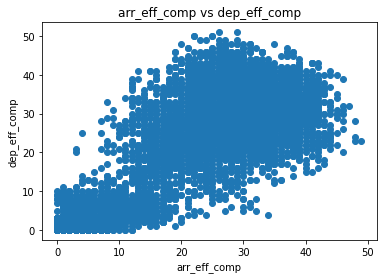

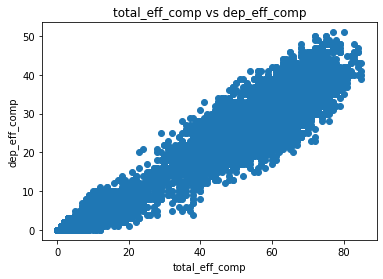

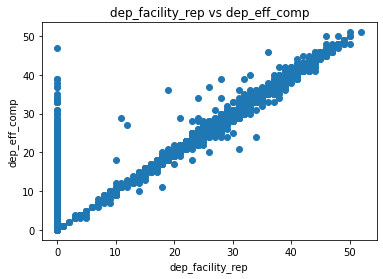

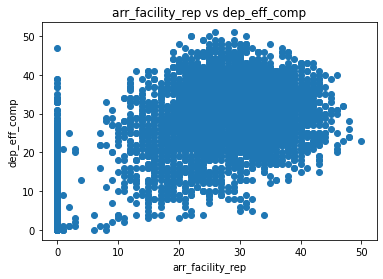

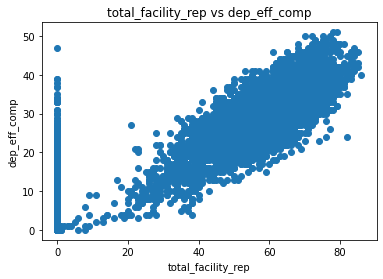

...

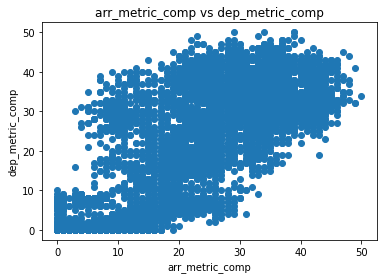

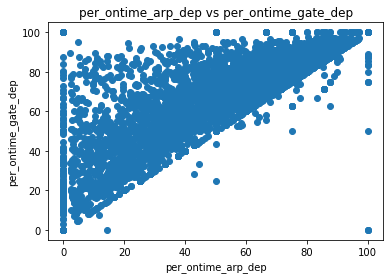

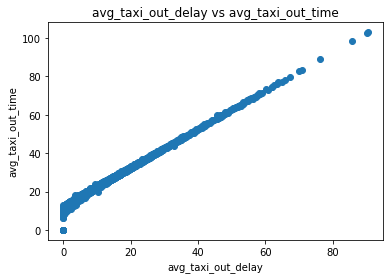

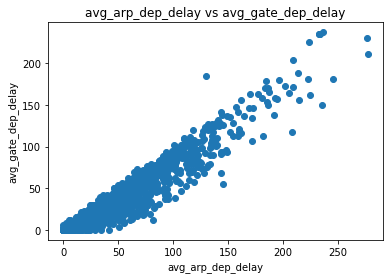

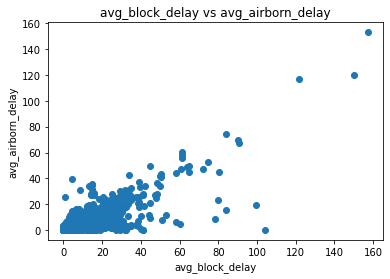

In [54]:
#Bivariate Analysis
def extract(target):
    store=[]
    for i in range(len(target)):
        for j in range(len(target.columns)):
            if i==j: 
                i+=1
                j=0
            if i>=len(target) or j>=len(target.columns): continue
            if target.iloc[i,j]>0.7 and target.iloc[i,j]<1: 
                store.append((i,j))
    return store

s=extract(ewr.corr())
target=ewr.corr()

for x,y in s:
    title = target.columns[x] + " vs " + target.columns[y]
    plt.scatter(x=ewr[target.index[x]],y=ewr[target.index[y]])
    plt.xlabel(target.columns[x])
    plt.ylabel(target.columns[y])
    plt.title(title)
    plt.show();

From the bivariate analysis it is clear that, the variables are corelated to each other.
Let us now move to the autocorrelation plots.

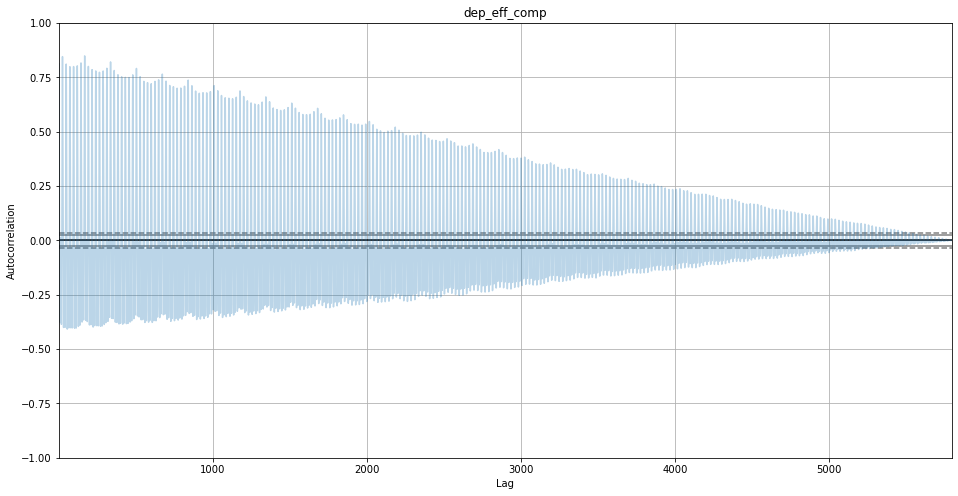

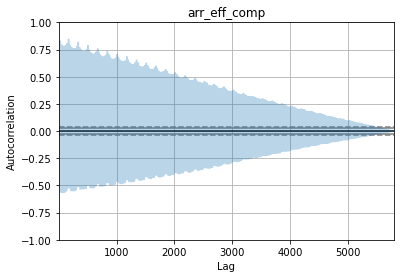

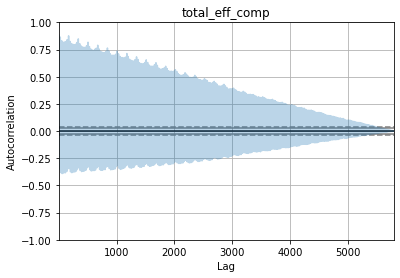

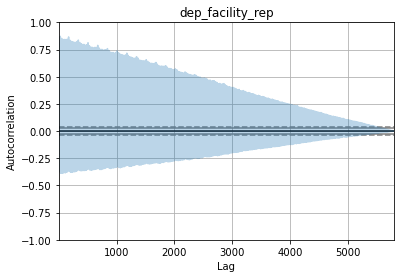

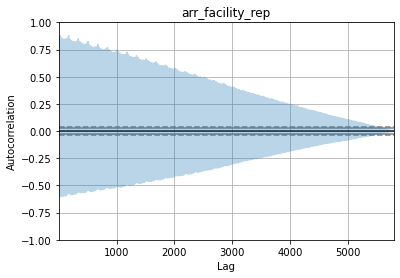

...

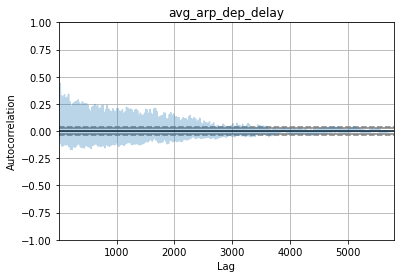

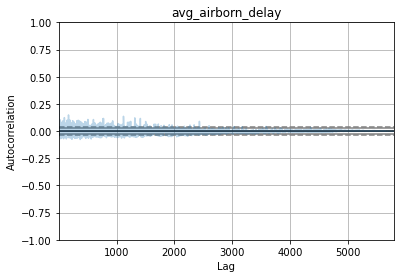

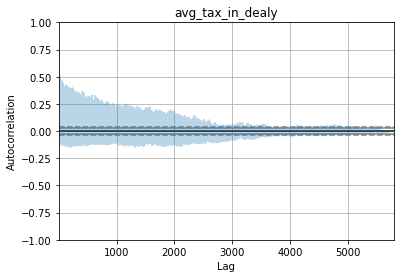

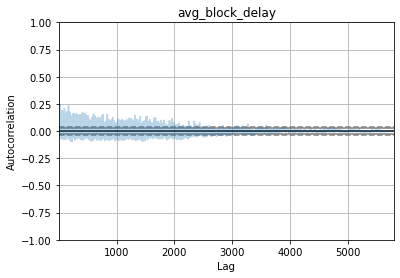

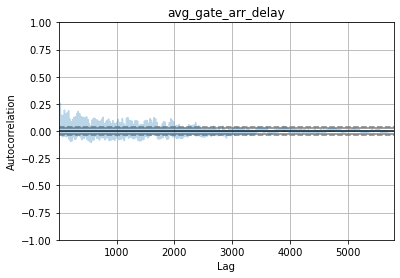

In [55]:
#Autocorrelation Plots
plt.figure(figsize=(16,8))
for i in ewr.columns.drop(['runway','weather']):
    pd.plotting.autocorrelation_plot(ewr[i], alpha=0.3)
    plt.title(i)
    plt.show();

From the auto-correlation plot it is clear that our data is non-random since majority of the values are significantly non-zero.

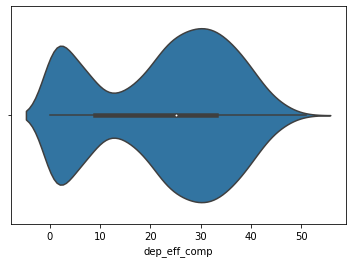

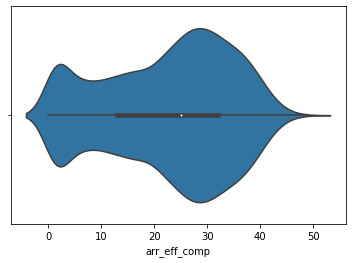

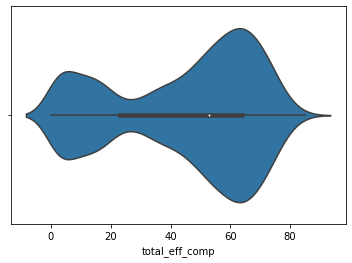

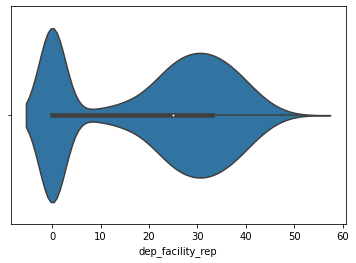

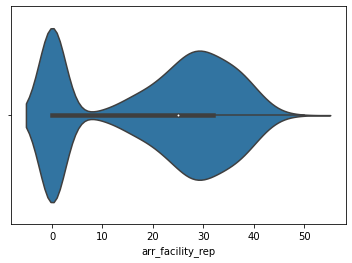

...

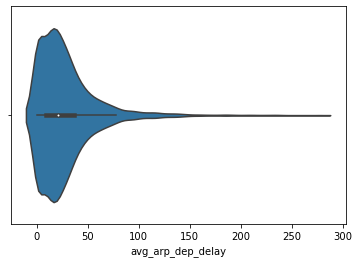

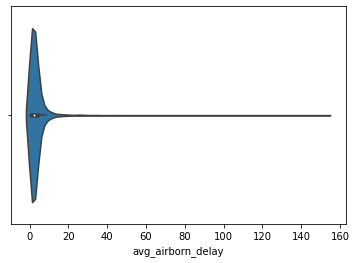

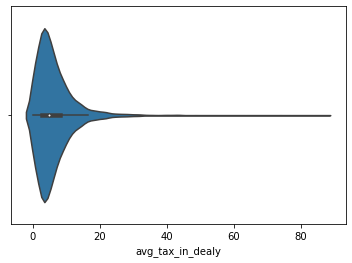

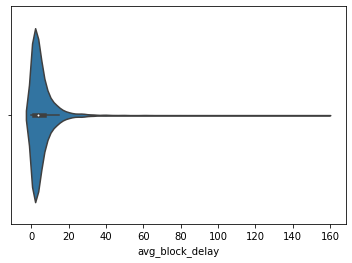

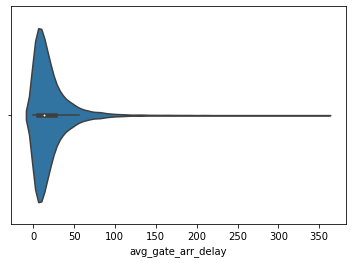

In [56]:
#Violin plot
for i in ewr.columns.drop(['runway','weather']):
    sns.violinplot(ewr[i])
    plt.show();

From the violin plot it is clear that we do not have many outliers in the data.
Let us now check the trend, residue and sesonality in the data.

C:\Users\hinal\anaconda3\lib\site-packages\statsmodels\tsa\seasonal.py:292: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(len(series), 1)


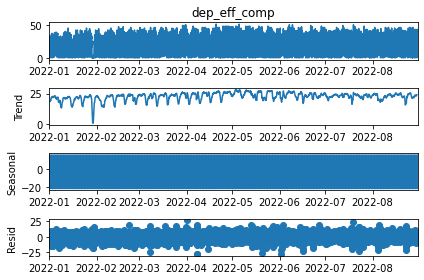

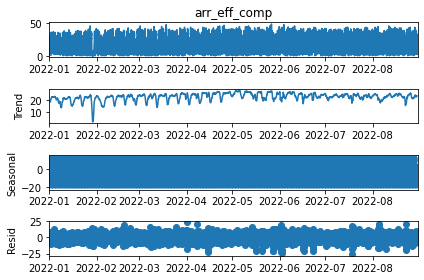

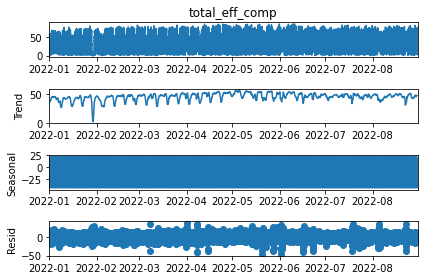

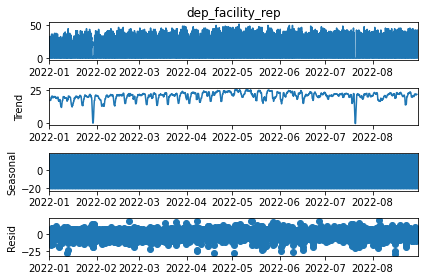

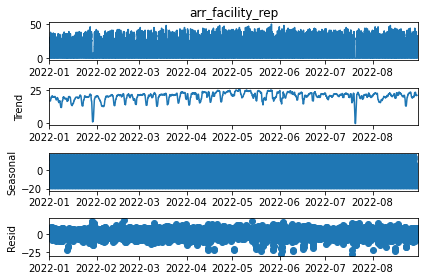

...

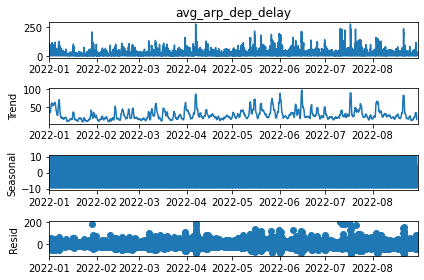

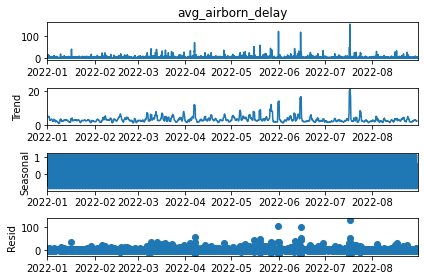

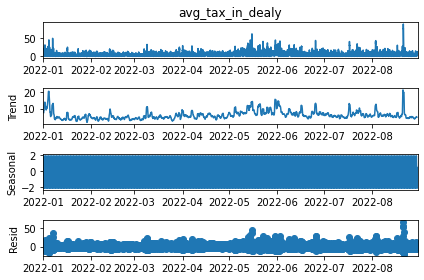

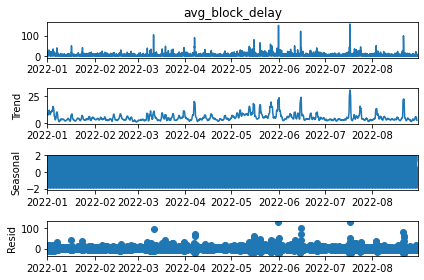

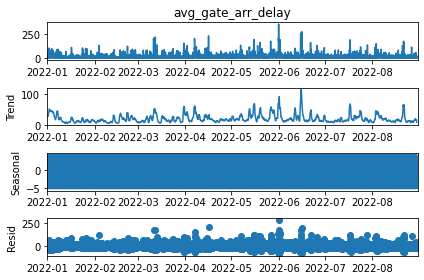

In [58]:
#trend, sesonality and residue
for i in ewr.columns.drop(['runway','weather']):
    decompose_result_mult = seasonal_decompose(ewr[i], model="additive")

    trend = decompose_result_mult.trend
    seasonal = decompose_result_mult.seasonal
    residual = decompose_result_mult.resid

    decompose_result_mult.plot(); 

We see that there is a sinusoidal trend and the sesonality is repeating. This is expected as the quotidian airport functioning involves some peak/off-peak hours.

Since, we are going to predict the number of arrivals, let us see the existing trend between, the current arrival demand and capacity.

Text(0.5, 1.0, 'Arrival computed, facility, demand')

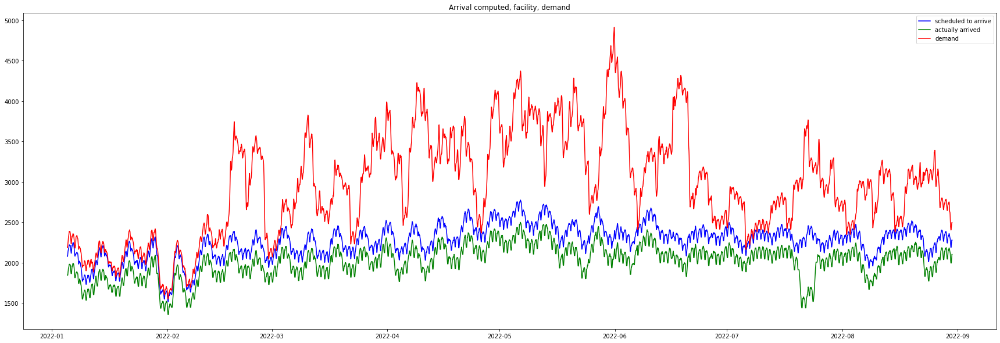

In [62]:
#trend between arrival capacity and demands
fig, ax = plt.subplots(figsize=(30, 10))
plt.plot(ewr['arr_eff_comp'].rolling(100).sum(), color='b',label='scheduled to arrive') 
plt.plot(ewr['arr_facility_rep'].rolling(100).sum(), color='g',label='actually arrived')
plt.plot(ewr['arr_demand_units'].rolling(100).sum(), color='r',label='demand')
plt.legend()
plt.title('Arrival computed, facility, demand')

The above graph gives a clear picture that the flights that arrived were lesser than the flights that were scheduled to arrive, hence causing a delay. Also the demanded arrivals were way more than the actual available capacity.

### REPORT

We see that the data is multimodal. This will not be an issue, as we are going to use ensemble models, which is a non-parametric approach. Hence we do not have to deal with normality, stationarity, and skewness of data.
Also, we see that the variables are correlated.
The data is not random.
We have very few outliers.
The trend is sinusoidal.
The demand of arrivals is way more than the capacity.

### VISUALIZATIONS

Let us first view the data before we start the visualizations

In [63]:
ewr.head()

,runway,weather,dep_eff_comp,arr_eff_comp,total_eff_comp,dep_facility_rep,arr_facility_rep,total_facility_rep,dep_demand_units,arr_demand_units,...,per_ontime_arp_dep,per_ontime_gate_arr,avg_gate_dep_delay,avg_taxi_out_time,avg_taxi_out_delay,avg_arp_dep_delay,avg_airborn_delay,avg_tax_in_dealy,avg_block_delay,avg_gate_arr_delay
date,,,,,,,,,,,,,,,,,,,,,
2022-01-01 00:00:00+00:00,22L | 22R,IMC,5,10,15,0,0,0,5,11,...,0.0,66.67,110.50,12.00,0.00,109.5,3.22,4.22,2.89,14.22
2022-01-01 01:00:00+00:00,22L | 22R,IMC,2,3,5,0,0,0,2,3,...,0.0,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00
2022-01-01 02:00:00+00:00,22L | 22R,IMC,0,0,0,0,0,0,0,0,...,0.0,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00
2022-01-01 03:00:00+00:00,22L | 22R,IMC,1,1,2,0,0,0,1,1,...,0.0,60.00,0.00,0.00,0.00,0.0,1.00,0.98,3.60,43.80
2022-01-01 04:00:00+00:00,22L | 22R,IMC,0,2,2,0,0,0,0,2,...,100.0,66.67,0.25,14.25,2.15,1.0,15.83,2.20,18.67,38.50


In [ ]:
######## add graphs

### PREDICTIONS

#### Feature Extraction

Let us first extract all the features that will be used for predicting the number of arrivals.

Weather can be an important factor that might affect the number of arrivals. The weather column here is a categorical column. We will have to convert it to integer for feature selection. 

In [67]:
#converting weather to integer (vectorization)
weather_dict = {
    'IMC': 0, 
    'VMC': 1
}
ewr['weather_vector'] = ewr['weather'].map(weather_dict).astype('int')

In [69]:
#select the feature and target
features = ewr.drop(['runway', 'weather', 'dep_eff_comp', 'arr_eff_comp', 'total_eff_comp',
       'dep_facility_rep', 'total_facility_rep',
       'dep_demand_units', 'total_demand_units',
       'adr', 'cap_utilized_percent',
       'dep_eff', 'sched_dep', 'saer',
       'dep_metric_comp', 'per_ontime_gate_dep',
       'per_ontime_arp_dep', 'avg_gate_dep_delay', 'avg_taxi_out_delay', 'avg_arp_dep_delay',
       'avg_airborn_delay', 'avg_tax_in_dealy', 'avg_block_delay',
       'avg_gate_arr_delay'], axis=1)
target = ewr['arr_eff_comp']
features.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 5796 entries, 2022-01-01 00:00:00+00:00 to 2022-08-30 11:00:00+00:00
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   arr_facility_rep     5796 non-null   int64  
 1   arr_demand_units     5796 non-null   int64  
 2   eff_aar              5796 non-null   int64  
 3   cap_aar              5796 non-null   int64  
 4   adr_plus_cap_aar     5796 non-null   int64  
 5   avg_cap              5796 non-null   float64
 6   arr_eff              5796 non-null   float64
 7   sched_arr            5796 non-null   int64  
 8   arr_metric_comp      5796 non-null   int64  
 9   per_ontime_gate_arr  5796 non-null   float64
 10  avg_taxi_out_time    5796 non-null   float64
 11  weather_vector       5796 non-null   int32  
dtypes: float64(4), int32(1), int64(7)
memory usage: 695.1 KB


We have selected our features and target. Let us now divide the data into training and testing sets. We are dividing the data manually and not using split as this is a time series data and split would divide the data randomly. We want the data to be divided in such a way the the time series stays intact. The size of the training data will be 70% and testing will be 30%.

In [70]:
X_train, X_test = features[:4056], features[4056:]
y_train, y_test = target[:4056], target[4056:]

#### Models

Firstly, let us do a lazypredict and see what all models are recommended.

In [71]:
clf = LazyRegressor(predictions=True)
models, predictions = clf.fit(X_train, X_test, y_train, y_test)
models

100%|██████████████████████████████████████████████████████████████████████████████████| 41/41 [00:12<00:00,  3.41it/s]


,Adjusted R-Squared,R-Squared,RMSE,Time Taken
Model,,,,
XGBRegressor,0.99,0.99,0.88,0.22
LGBMRegressor,0.99,0.99,0.96,0.11
HistGradientBoostingRegressor,0.99,0.99,0.98,0.44
GradientBoostingRegressor,0.99,0.99,1.01,0.39
ExtraTreesRegressor,0.99,0.99,1.05,0.55
MLPRegressor,0.99,0.99,1.09,4.11
RandomForestRegressor,0.99,0.99,1.10,0.87
BaggingRegressor,0.99,0.99,1.12,0.10
DecisionTreeRegressor,0.99,0.99,1.34,0.02


Regression models work the best here. 
We will perform try the below models:
    1. Extra Tree Regression
    2. Random Forest Regression
    3. Hist Gradient Boosting Regression
    4. Ordinary Least Squares (OLS)
    5. Long Short Term Memory (LSTM)
    6. Arima Model
    7. Prophet V Model

#### Regression

In [73]:
#create the regression models
ETR_model = ExtraTreesRegressor(n_estimators=100, random_state=0).fit(X_train, y_train)
RFR_model = RandomForestRegressor(n_estimators=100, random_state=0).fit(X_train, y_train)
HGBR_model =  HistGradientBoostingRegressor().fit(X_train, y_train)

In [74]:
#predictions
ETR_predict = ETR_model.predict(X_test)
RFR_predict = RFR_model.predict(X_test)
HGBR_predict = HGBR_model.predict(X_test)

In [76]:
#get the various model metrics
print('============================================ ETR ============================================')
print("Mean absolute error =", round(sm.mean_absolute_error(y_test, ETR_predict), 2)) 
print("Mean squared error =", round(sm.mean_squared_error(y_test, ETR_predict), 2)) 
print("Median absolute error =", round(sm.median_absolute_error(y_test, ETR_predict), 2)) 
print("Explain variance score =", round(sm.explained_variance_score(y_test, ETR_predict), 2)) 
print("R2 score =", round(sm.r2_score(y_test, ETR_predict), 2))

print('============================================ RFR ============================================')
print("Mean absolute error =", round(sm.mean_absolute_error(y_test, RFR_predict), 2)) 
print("Mean squared error =", round(sm.mean_squared_error(y_test, RFR_predict), 2)) 
print("Median absolute error =", round(sm.median_absolute_error(y_test, RFR_predict), 2)) 
print("Explain variance score =", round(sm.explained_variance_score(y_test, RFR_predict), 2)) 
print("R2 score =", round(sm.r2_score(y_test, RFR_predict), 2))

print('============================================ HGBR ============================================')
print("Mean absolute error =", round(sm.mean_absolute_error(y_test, HGBR_predict), 2)) 
print("Mean squared error =", round(sm.mean_squared_error(y_test, HGBR_predict), 2)) 
print("Median absolute error =", round(sm.median_absolute_error(y_test, HGBR_predict), 2)) 
print("Explain variance score =", round(sm.explained_variance_score(y_test, HGBR_predict), 2)) 
print("R2 score =", round(sm.r2_score(y_test, HGBR_predict), 2))

============================================ ETR ============================================
Mean absolute error = 0.44
Mean squared error = 1.13
Median absolute error = 0.11
Explain variance score = 0.99
R2 score = 0.99
============================================ RFR ============================================
Mean absolute error = 0.4
Mean squared error = 1.14
Median absolute error = 0.04
Explain variance score = 0.99
R2 score = 0.99
============================================ HGBR ============================================
Mean absolute error = 0.4
Mean squared error = 0.95
Median absolute error = 0.13
Explain variance score = 0.99
R2 score = 0.99


In [78]:
#function to calculate moving average
def moving_average(a, n=3) :
    ret = np.cumsum(a, dtype=float)
    ret[n:] = ret[n:] - ret[:-n]
    return ret[n - 1:] / n

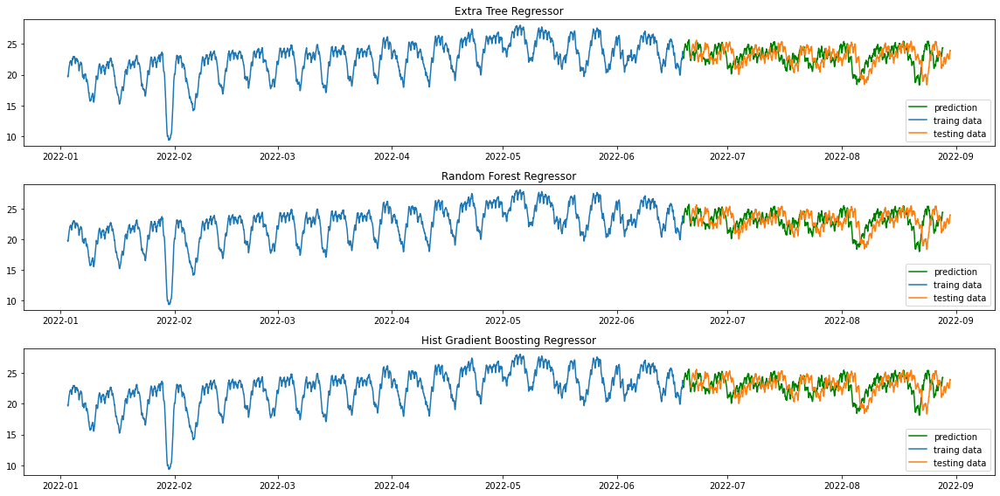

In [82]:
#plot the predictions
plt.figure(figsize=(16,8))
plt.subplot(3,1,1)

plt.plot(y_test.index.values[:-49], moving_average(ETR_predict, n=50), label='prediction', color='g')
plt.plot(y_train.rolling(50).mean(),label="traing data")
plt.plot(y_test.rolling(50).mean(),label="testing data")
plt.legend()
plt.title("Extra Tree Regressor")

plt.subplot(3,1,2)
plt.plot(y_test.index.values[:-49], moving_average(RFR_predict, n=50), label='prediction',color='g')
plt.plot(y_train.rolling(50).mean(),label="traing data")
plt.plot(y_test.rolling(50).mean(),label="testing data")
plt.legend()
plt.title("Random Forest Regressor")

plt.subplot(3,1,3)
plt.plot(y_test.index.values[:-49], moving_average(HGBR_predict, n=50), label='prediction',color='g')
plt.plot(y_train.rolling(50).mean(),label="traing data")
plt.plot(y_test.rolling(50).mean(),label="testing data")
plt.legend()
plt.title("Hist Gradient Boosting Regressor")

plt.tight_layout()
plt.show()

#### Ordinary Least Squares

In [85]:
ols = sma.OLS(y_train, X_train).fit()
print(ols.summary())

                                 OLS Regression Results                                
Dep. Variable:           arr_eff_comp   R-squared (uncentered):                   0.977
Model:                            OLS   Adj. R-squared (uncentered):              0.977
Method:                 Least Squares   F-statistic:                          1.567e+04
Date:                Mon, 28 Nov 2022   Prob (F-statistic):                        0.00
Time:                        22:08:19   Log-Likelihood:                         -11233.
No. Observations:                4056   AIC:                                  2.249e+04
Df Residuals:                    4045   BIC:                                  2.256e+04
Df Model:                          11                                                  
Covariance Type:            nonrobust                                                  
                          coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------

#### Long Short Term Memory (LSTM)

181/181 [==============================] - 2s 8ms/step - loss: 0.2466


<AxesSubplot:xlabel='Date', ylabel='Values'>

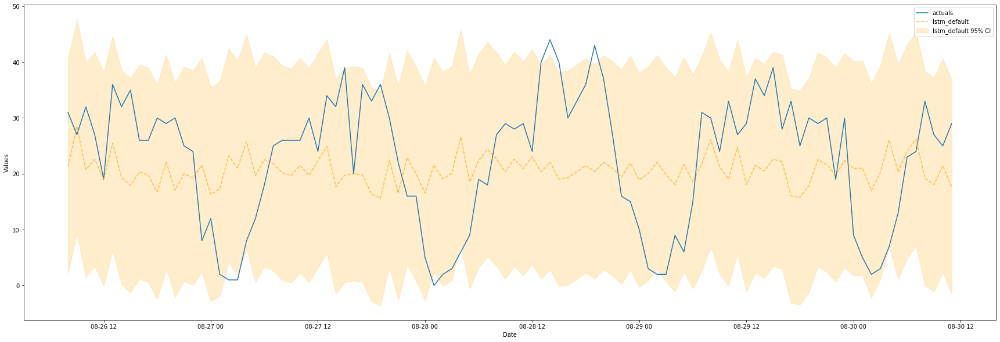

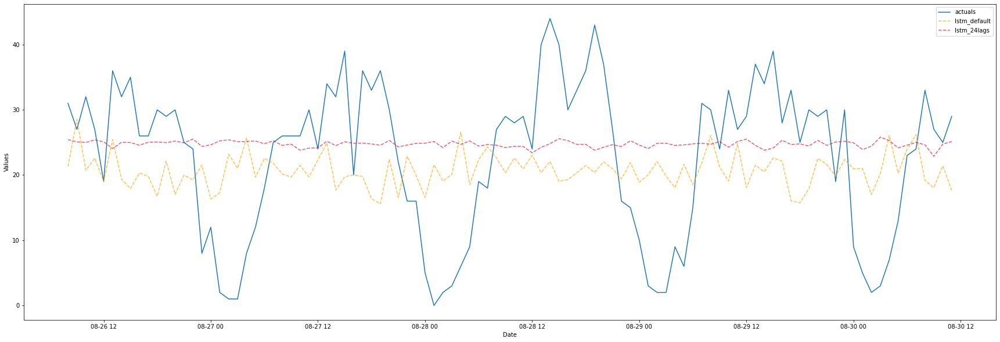

In [87]:
f = Forecaster(y=ewr['arr_eff_comp'], current_dates=ewr.index.values)
f.set_test_length(100)       # 1. 12 observations to test the results
f.generate_future_dates(1) # 2. 12 future points to forecast
f.set_estimator('lstm')
f.manual_forecast(call_me='lstm_default')
f.plot_test_set(ci=True, figsize=(30,10),include_train=False)

f.manual_forecast(call_me='lstm_24lags',lags=24)
f.plot_test_set(ci=False,figsize=(30,10),include_train=False)

181/181 [==============================] - 2s 7ms/step - loss: 0.1844


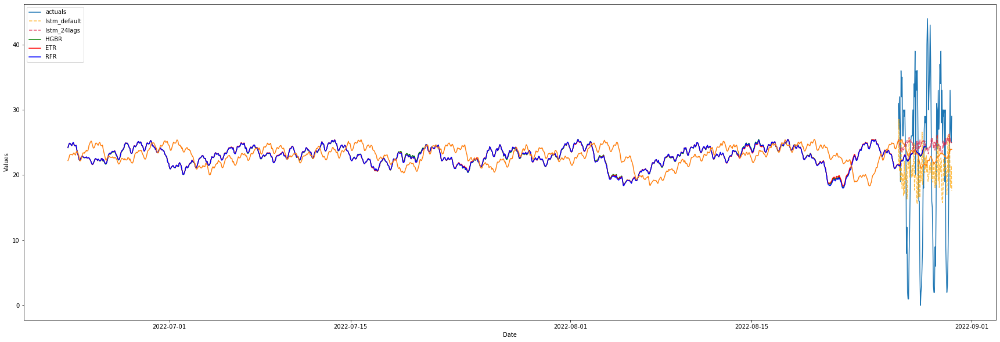

In [95]:
f.manual_forecast(call_me='lstm_24lags',lags=24)
f.plot_test_set(ci=False,figsize=(30,10),include_train=False)

plt.plot(y_test.index.values[:-49][100:], moving_average(HGBR_predict, n=50)[100:], label='HGBR', color='g')
plt.plot(y_test.index.values[:-49][100:], moving_average(ETR_predict, n=50)[100:], label='ETR', color='r')
plt.plot(y_test.index.values[:-49][100:], moving_average(RFR_predict, n=50)[100:], label='RFR',color='b')

plt.plot(y_test.rolling(50).mean()[100:])
plt.legend()
plt.show()

#### Arima

Let us first perform the ADF test. The ADF test aims to reject the null hypothesis that the given time-series data is non-stationary. It calculates the p-value and compares it with a threshold value or significance level of 0.05. If the p-value is less than this level, then the data is stationary; else, the differencing order is incremented by one.

In [91]:
stat_test = adfuller(ewr['arr_eff_comp'])
print('The test statistic is {} and p-value is {}'.format(stat_test[0], stat_test[1]))

The test statistic is -11.030353220576128 and p-value is 5.688789549511529e-20


Since, the data is already stationary, we do not need to do differencing. 

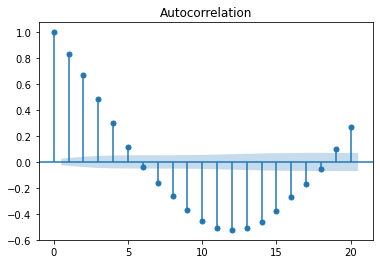

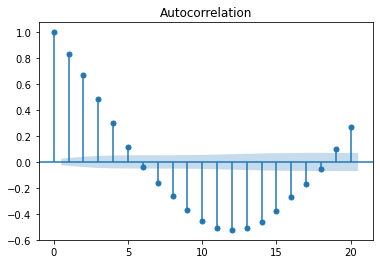

In [97]:
sma.graphics.tsa.plot_acf(ewr['arr_eff_comp'], lags=20)

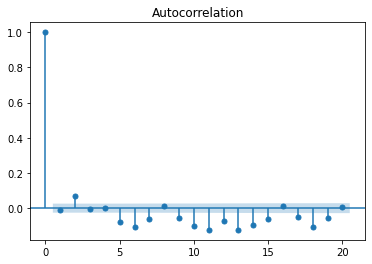

In [96]:
sma.graphics.tsa.plot_acf(ewr['arr_eff_comp'].diff().dropna(), lags=20);

From the autocorrelation graph, we can decide if more differencing is needed. If collectively the autocorrelations, or the data point of each lag (in the horizontal axis), are positive for several consecutive lags, more differencing might be needed. Conversely, if more data points are negative, the series is over-differenced.
In our case, no differencing is needed. 

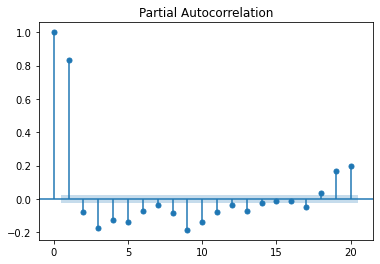

In [98]:
sma.graphics.tsa.plot_pacf(ewr['arr_eff_comp'], lags=20);

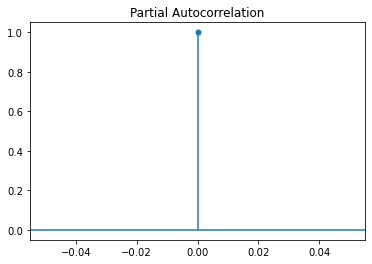

In [99]:
sma.graphics.tsa.plot_pacf(ewr['arr_eff_comp'].diff(), lags=20);

In [102]:
arima_model = ARIMA(ewr['arr_eff_comp'], order=(1,0,1))
model = arima_model.fit()
print(model.summary())

                               SARIMAX Results                                
Dep. Variable:           arr_eff_comp   No. Observations:                 5796
Model:                 ARIMA(1, 0, 1)   Log Likelihood              -19144.429
Date:                Mon, 28 Nov 2022   AIC                          38296.858
Time:                        22:23:17   BIC                          38323.518
Sample:                    01-01-2022   HQIC                         38306.133
                         - 08-30-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         22.6226      0.510     44.345      0.000      21.623      23.622
ar.L1          0.8138      0.011     73.555      0.000       0.792       0.836
ma.L1          0.0668      0.015      4.524      0.0

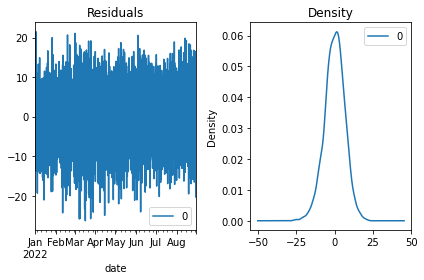

In [104]:
# Plot residual errors
residuals = pd.DataFrame(model.resid)
fig, ax = plt.subplots(1,2)
residuals.plot(title="Residuals", ax=ax[0])
residuals.plot(kind='kde', title='Density', ax=ax[1])
plt.tight_layout()
plt.show()

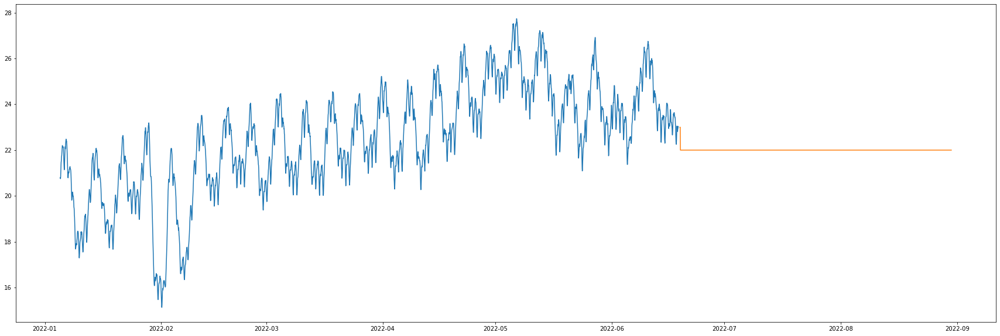

In [113]:
#forcasting
import copy
forecast_test = model.forecast(len(ewr.arr_eff_comp[4050:]))

copy = copy.deepcopy(ewr.arr_eff_comp)
for i in range(4050):
    copy[i]=0
for i in range(4050, len(copy)):
    copy[i]=forecast_test[i-4050]

fig, ax = plt.subplots(figsize=(30,10))
plt.plot(ewr.arr_eff_comp[:4050].rolling(100).mean())
plt.plot(copy[4060:])
plt.show()

#### Prophet V

In [117]:
ewr_prophet = pd.read_csv("aviation_data_merged.csv")
ewr_prophet = ewr_prophet[:-36]
prophet = pd.DataFrame({'ds': ewr_prophet['date'],'y':ewr_prophet.arr_eff_comp})
display(prophet)

,ds,y
0,1/1/22,10
1,1/1/22,3
2,1/1/22,0
3,1/1/22,1
4,1/1/22,2
...,...,...
5796,8/30/22,25
5797,8/30/22,29
5798,8/30/22,26
5799,8/30/22,29


In [118]:
m = Prophet()
m.fit(prophet)
future = m.make_future_dataframe(periods=365)
future.tail()

22:30:18 - cmdstanpy - INFO - Chain [1] start processing
22:30:18 - cmdstanpy - INFO - Chain [1] done processing


,ds
602,2023-08-26
603,2023-08-27
604,2023-08-28
605,2023-08-29
606,2023-08-30


In [119]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
602,2023-08-26,12.85,-3.15,29.63
603,2023-08-27,15.83,0.50,31.23
604,2023-08-28,17.24,1.50,31.55
605,2023-08-29,18.55,3.30,35.13
606,2023-08-30,18.04,2.21,32.78


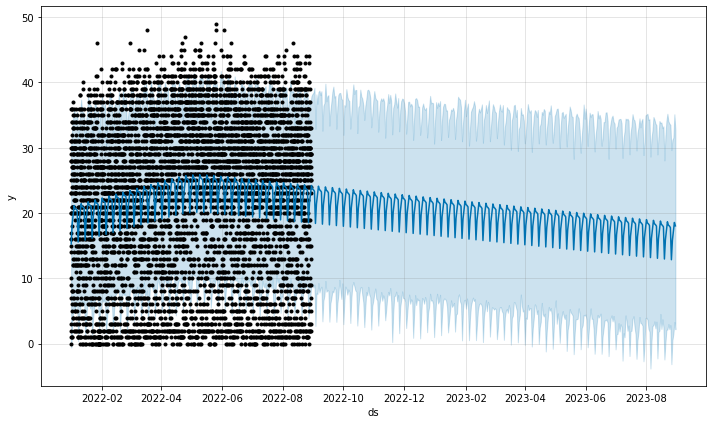

In [120]:
fig1 = m.plot(forecast)

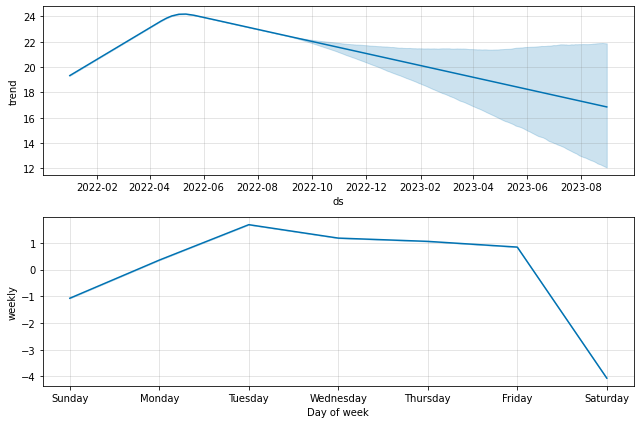

In [121]:
fig2 = m.plot_components(forecast)

In [124]:
plot_plotly(m, forecast)

In [125]:
plot_components_plotly(m, forecast)

### CLASSIFICATION

In [133]:
target_class = ewr['weather_vector']
feature = ewr[['avg_taxi_out_time','arr_eff_comp','saer','arr_demand_units','arr_metric_comp']]
x_train, x_test, y_train, y_test = feature[:4050], feature[4050:], target_class[:4050], target_class[4050:]

#clf1 = LazyClassifier(predictions=True)
#models1, predictions1 = clf.fit(x_train, x_test, y_train, y_test)
#models1.sort_values('Accuracy',ascending=False)

dummy_clf = DummyClassifier(strategy="most_frequent")
dummy_clf.fit(x_train, y_train)
p_dummy = dummy_clf.predict(x_test)
dummy_clf.score(x_test,y_test)

0.9129438717067583